In [7]:
import os
os.environ["OMP_NUM_THREADS"] = "4"

In [3]:
from graph_tool.all import *
import pandas as pd
import numpy as np
import scipy as sp
import random
from sklearn.covariance import LedoitWolf, OAS
import matplotlib.pyplot as plt
import matplotlib.cm as mpl
#import seaborn as sns
import statsmodels.api as sm
from multipy.fdr import qvalue
from multipy.fdr import lsu

In [4]:
from trim_networks import *
from fit_sbm import *

In [5]:
def FilterByGraph(g, g_ref):
    genes = g.vp.genes

    keep = g.new_vertex_property("bool", True)
    for v in g.get_vertices():
        if genes[v] not in g_ref.vp.genes:
            keep[v] = False
    tv = GraphView(g, vfilt=keep)
    g = Graph(tv, prune = True)
    return g


def KeepRandomVertices(g, num_vertices_to_keep):
    keep = g.new_vertex_property("bool")
    vertices = list(g.get_vertices())
    
    # Select a random subset of vertices
    subset_vertices = np.random.choice(vertices, num_vertices_to_keep, replace=False) 
    
    # Mark the selected vertices to keep
    for v in subset_vertices:
        keep[v] = True
    
    # Create a new graph view with the filtered vertices
    tv = GraphView(g, vfilt=keep)
    
    # Create a new graph from the graph view and prune unused vertices
    g_subset = Graph(tv, prune=True)
    
    return g_subset


def KeepRandomSubset(g, subset_ratio):
    keep = g.new_vertex_property("bool")
    vertices = list(g.get_vertices())
    num_vertices = len(vertices)
    num_subset = int(num_vertices * subset_ratio)
    
    # Select a random subset of vertices
    subset_vertices = np.random.choice(vertices, num_subset, replace=False)
    
    # Mark the selected vertices to keep
    for v in subset_vertices:
        keep[v] = True
    
    # Create a new graph view with the filtered vertices
    tv = GraphView(g, vfilt=keep)
    
    # Create a new graph from the graph view and prune unused vertices
    g_subset = Graph(tv, prune=True)
    
    return g_subset

In [6]:
folder = "../data/output/SBM/graphs/"
#g_body = load_graph(folder + "VOOMCounts_CPM1_body_ctrl_249ind_counts3M_covfree_Aug3121.xml.gz")
g_head = load_graph(folder + "VOOMCounts_CPM1_head_ctrl_248ind_counts3M_covfree_Aug3121.xml.gz")

#g_dict = {"head": g_head, "body": g_body}

In [8]:
g_total = KeepRandomVertices(g_head, 150)
g_total
corr = g_total.edge_properties["spearman"]
g_total.ep.weight = g_total.new_edge_property("double", (2*np.arctanh(corr.a)))
g_total

<Graph object, undirected, with 150 vertices and 11175 edges, 1 internal vertex property, 6 internal edge properties, at 0x1ca9d1f40>

In [9]:
g_050 = filterByFDR(g_total, 0.5, True)
g_025 = filterByFDR(g_total, 0.25, True)
g_1e1 = filterByFDR(g_total, 1e-1, True)
g_5e2 = filterByFDR(g_total, 5e-2, True)
g_1e2 = filterByFDR(g_total, 1e-2, True)

In [11]:
g_050 = FilterByGraph(g_050, g_1e2)
g_025 = FilterByGraph(g_025, g_1e2)
g_1e1 = FilterByGraph(g_1e1, g_1e2)
g_5e2 = FilterByGraph(g_5e2, g_1e2)
g_1e2 = FilterByGraph(g_1e2, g_1e2)
len(g_050.get_vertices()), len(g_025.get_vertices()), len(g_1e1.get_vertices()), len(g_5e2.get_vertices()), len(g_1e2.get_vertices())

(113, 113, 113, 113, 113)

In [38]:
state_050 = minimize_nested_blockmodel_dl(g_050, 
                                          state_args=dict(recs=[g_025.ep.weight],
                                          rec_types=["real-normal"]))

In [39]:
mcmc_equilibrate(state_050, wait=100, nbreaks=2, mcmc_args=dict(niter=10))

(4123.563057148914, 4383561, 132243)

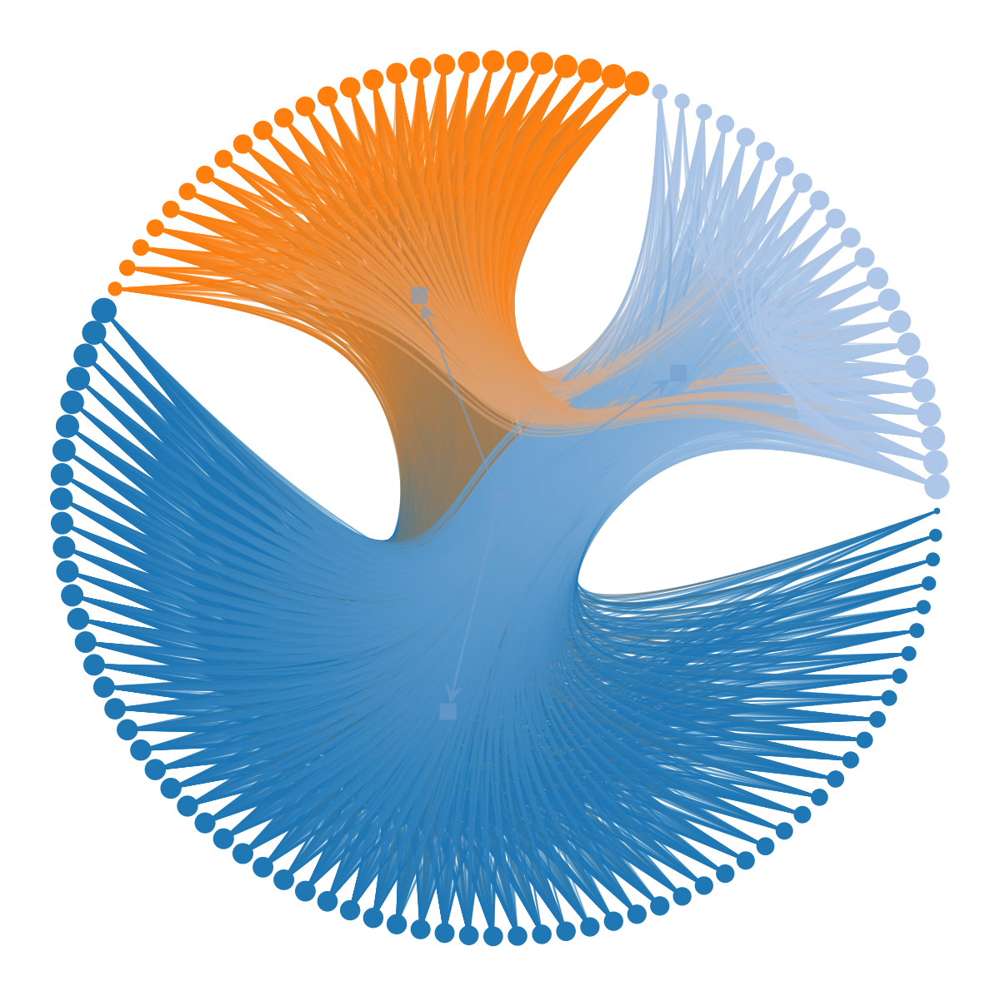

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cb19a420, at 0x1ccb4a7e0>,
 <GraphView object, directed, with 117 vertices and 116 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ccc33440, at 0x1ccc332c0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ccc33440, at 0x1ccc33470>, False), at 0x1ccc33440>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ccc33440, at 0x1ccc33410>)

In [40]:
state_050.draw()

In [13]:
state_025 = minimize_nested_blockmodel_dl(g_025, 
                                          state_args=dict(recs=[g_025.ep.weight],
                                          rec_types=["real-normal"]))


In [43]:
mcmc_equilibrate(state_025, wait=100, nbreaks=2, mcmc_args=dict(niter=10))

(3721.4634356171455, 1607474, 247127)

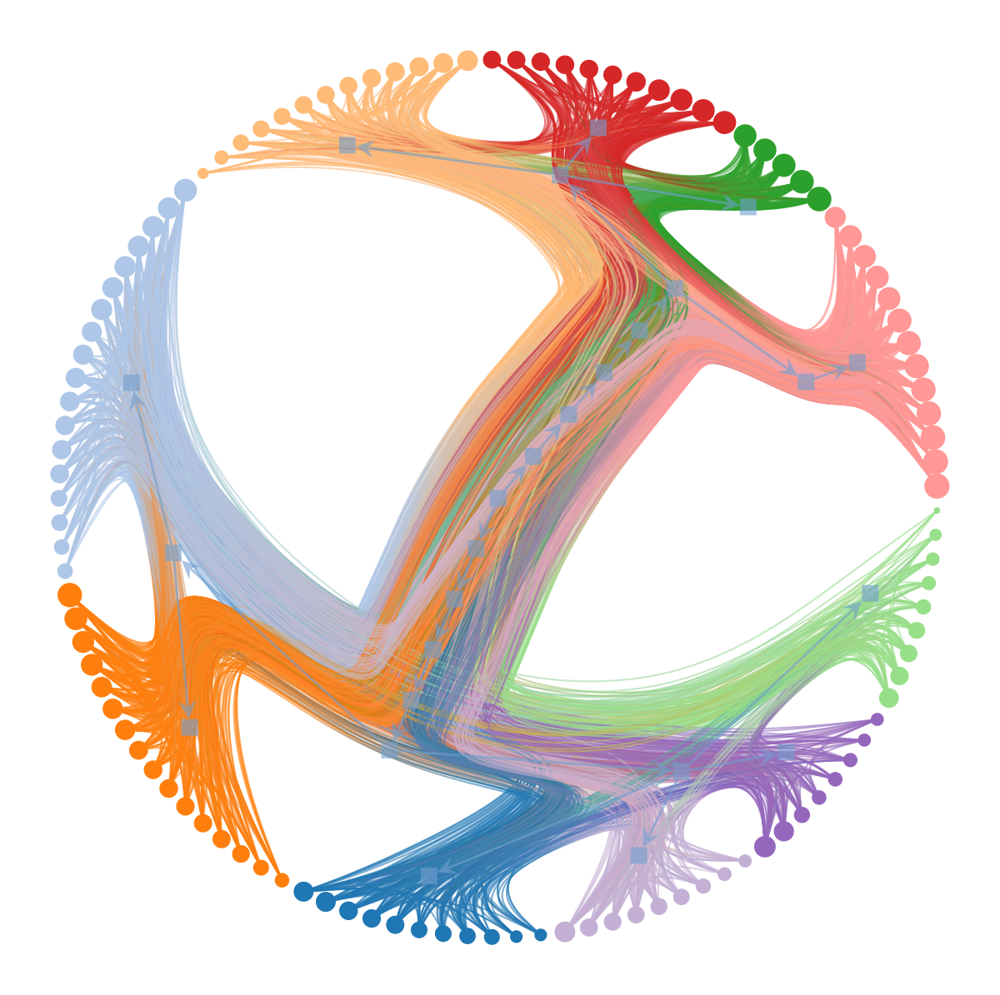

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cc92e0f0, at 0x1ccba2300>,
 <GraphView object, directed, with 138 vertices and 137 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ccc39eb0, at 0x1ccc38740>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ccc39eb0, at 0x1ccc39370>, False), at 0x1ccc39eb0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ccc39eb0, at 0x1ccc33fe0>)

In [44]:
state_025.draw()

In [16]:
color = state_025.get_bs()[0]
color

PropertyArray([77, 80, 77, 37, 14, 96, 95, 96, 96, 14, 14, 14, 95, 64, 96,
               37, 64, 14, 29, 29, 64, 96, 95, 37, 80, 29, 77, 95, 80, 29,
               77, 95, 96, 96, 64, 77, 96, 95, 37, 29, 80, 77, 29, 14, 78,
               77, 77, 29, 78, 64, 37, 80, 37, 29, 78, 78, 14, 96, 80, 80,
               37, 64, 29, 14, 29, 37, 37, 77, 95, 37, 37, 64, 80, 37, 96,
               77, 95, 29, 29, 78, 14, 37, 80, 64, 29, 78, 29, 29, 37, 78,
               77, 96, 29, 78, 14, 37, 14, 14, 14, 37, 14, 37, 37, 80, 96,
               96, 95, 14, 96, 77, 95, 14, 14], dtype=int32)

In [17]:
state_1e1 = minimize_nested_blockmodel_dl(g_1e1, init_bs=state_025.get_bs(), 
                                          state_args=dict(recs=[g_1e1.ep.weight],
                                          rec_types=["real-normal"]))
mcmc_equilibrate(state_1e1, wait=100, nbreaks=2, mcmc_args=dict(niter=10))


(2730.748421956857, 1385376, 318666)

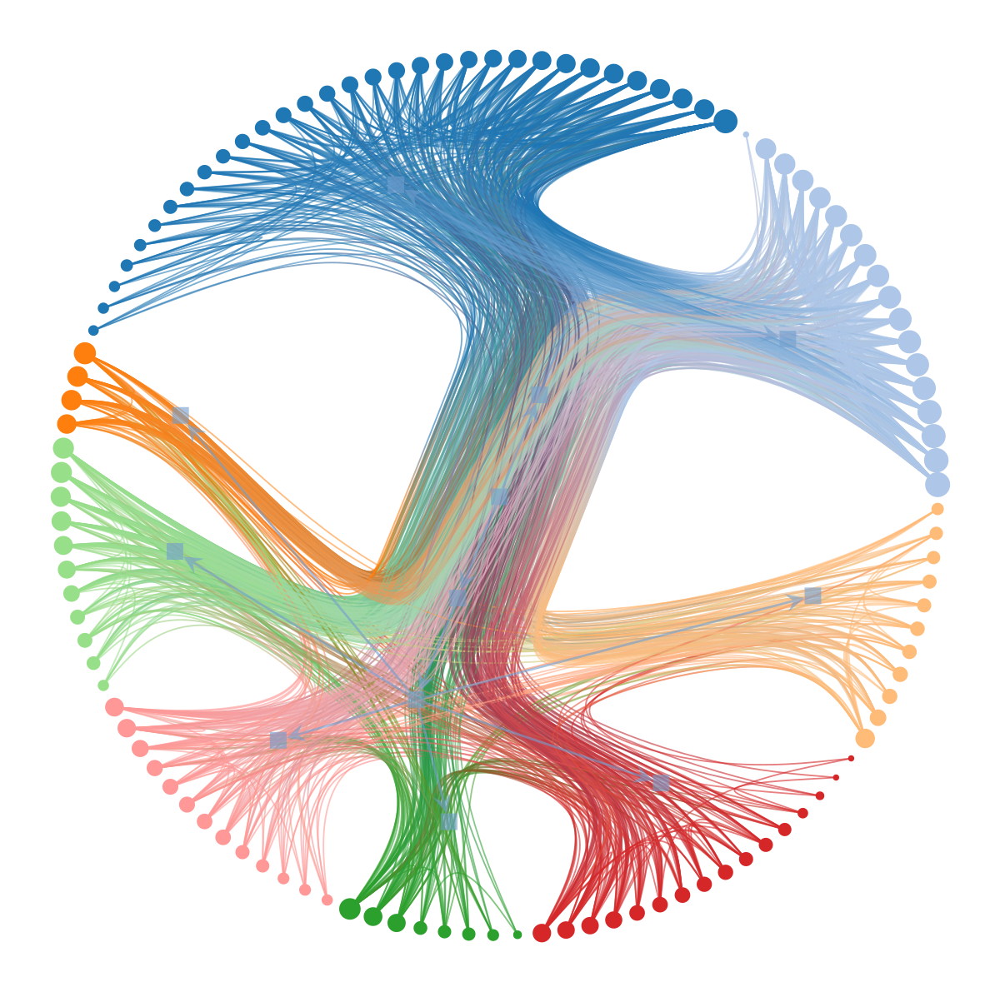

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1caa8dac0, at 0x1ccb46a50>,
 <GraphView object, directed, with 126 vertices and 125 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ccb4a930, at 0x1ccb4acc0>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ccb4a930, at 0x1ccb49160>, False), at 0x1ccb4a930>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ccb4a930, at 0x1ccb16b10>)

In [18]:
state_1e1.draw()

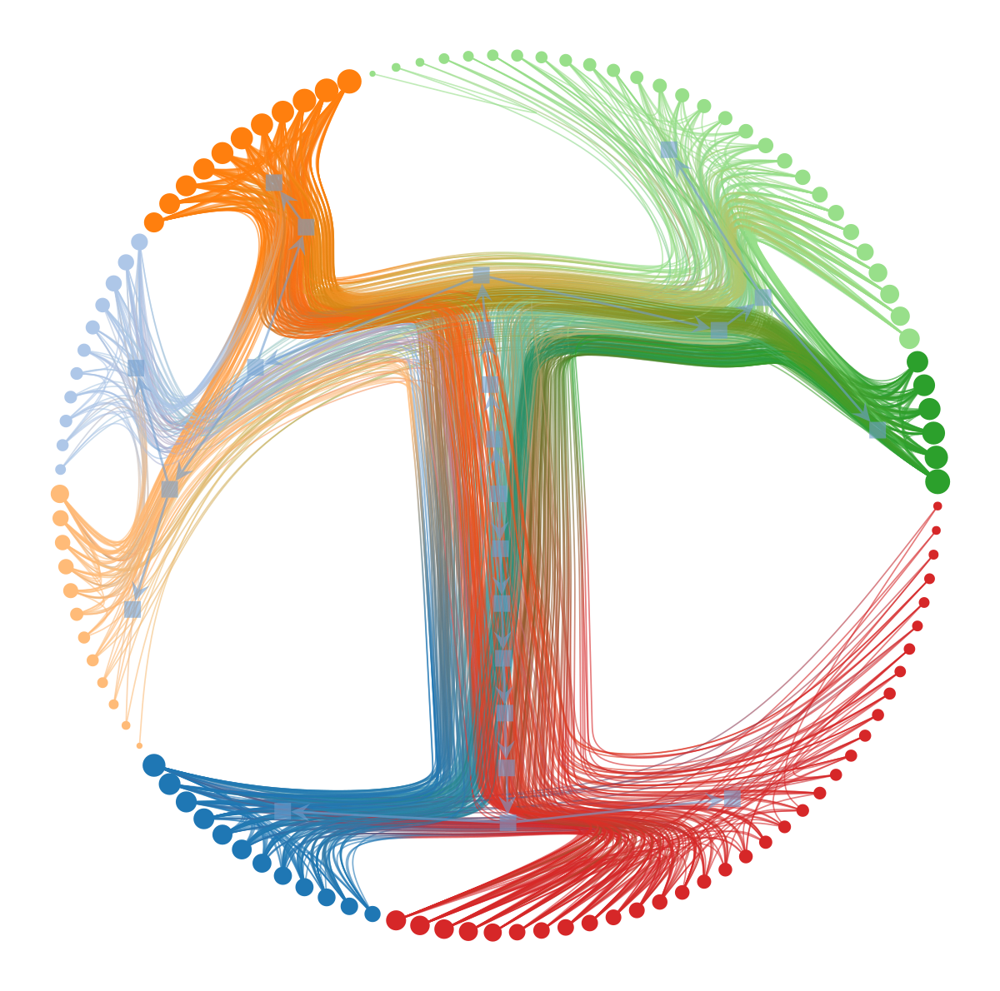

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cb169d90, at 0x1cc458a70>,
 <GraphView object, directed, with 136 vertices and 135 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ccb16f00, at 0x1ccb97080>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ccb16f00, at 0x1ccb96f90>, False), at 0x1ccb16f00>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ccb16f00, at 0x1ccb95850>)

In [19]:
state_5e2 = minimize_nested_blockmodel_dl(g_5e2, init_bs=state_025.get_bs(), 
                                          state_args=dict(recs=[g_5e2.ep.weight],
                                          rec_types=["real-normal"]))
mcmc_equilibrate(state_5e2, wait=100, nbreaks=2, mcmc_args=dict(niter=10))
state_5e2.draw()

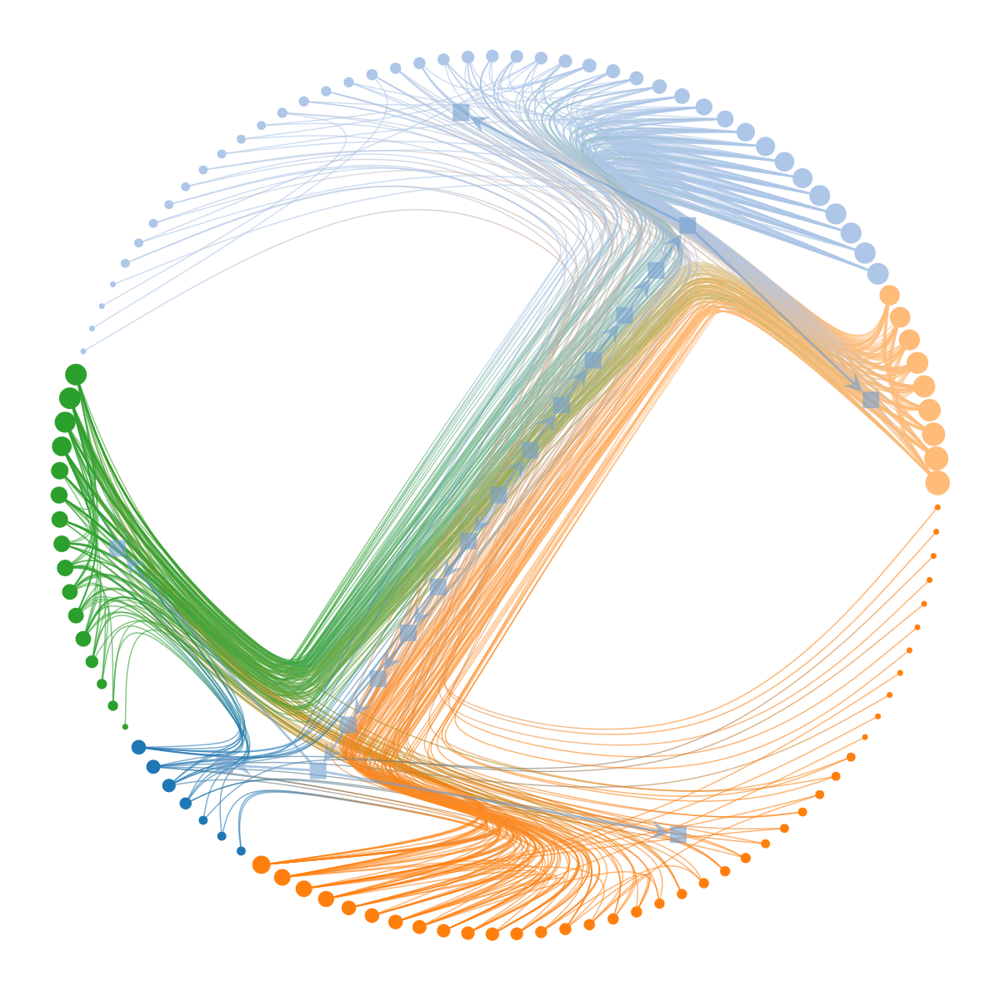

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x1cac2ba40, at 0x1ccb9e450>,
 <GraphView object, directed, with 131 vertices and 130 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x1ccb98530, at 0x1ccb9fe90>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x1ccb98530, at 0x1ccb9fd40>, False), at 0x1ccb98530>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x1ccb98530, at 0x1ccb9f290>)

In [20]:
state_1e2 = minimize_nested_blockmodel_dl(g_1e2, init_bs=state_025.get_bs(), 
                                          state_args=dict(recs=[g_1e2.ep.weight],
                                          rec_types=["real-normal"]))
mcmc_equilibrate(state_1e2, wait=100, nbreaks=2, mcmc_args=dict(niter=10))
state_1e2.draw()

In [45]:
[partition_overlap(state_025.get_bs()[0], state_025.get_bs()[0], norm=True),
 partition_overlap(state_025.get_bs()[0], state_1e1.get_bs()[0], norm=True),
 partition_overlap(state_025.get_bs()[0], state_5e2.get_bs()[0], norm=True),
 partition_overlap(state_025.get_bs()[0], state_1e2.get_bs()[0], norm=True)]


[1.0, 0.6460176991150443, 0.5221238938053098, 0.336283185840708]

In [36]:

B = len(state_025.get_bs()[0])
N = len(g_1e1.get_vertices())
x = np.random.randint(0, 10, N)
y = np.random.randint(0, 10, N)
partition_overlap(x, y)

0.23008849557522124

In [24]:
def density(g):
    N = len(g.get_vertices())
    Et = (N * N - N)/2
    E = len(g.get_edges())
    density = E/Et
    return density

In [25]:
[density(g_050), density(g_025), density(g_1e1), density(g_5e2), density(g_1e2)]

[0.5072692793931732,
 0.3138432364096081,
 0.20006321112515804,
 0.14538558786346398,
 0.08343868520859671]

In [ ]:
g_ref = Graph(tv_head_1e2, prune = True)
g = Graph(tv_head_1e1, prune = True)



g_1e1 = FilterByGraph(g, g_ref)
g_1e1.ep.z_s = g_1e1.new_edge_property("double", (2*np.arctanh(g_1e1.ep["spearman"].a)))


In [ ]:
state_head_1e1 = minimize_nested_blockmodel_dl(g_1e1, init_bs=bs_head, 
                                               state_args=dict(recs=[g_1e1.ep.z_s],
                                               rec_types=["real-normal"]))

NameError: name 'bs_head' is not defined

In [ ]:
mcmc_equilibrate(state_head_1e1, wait=100, nbreaks=1, mcmc_args=dict(niter=10))

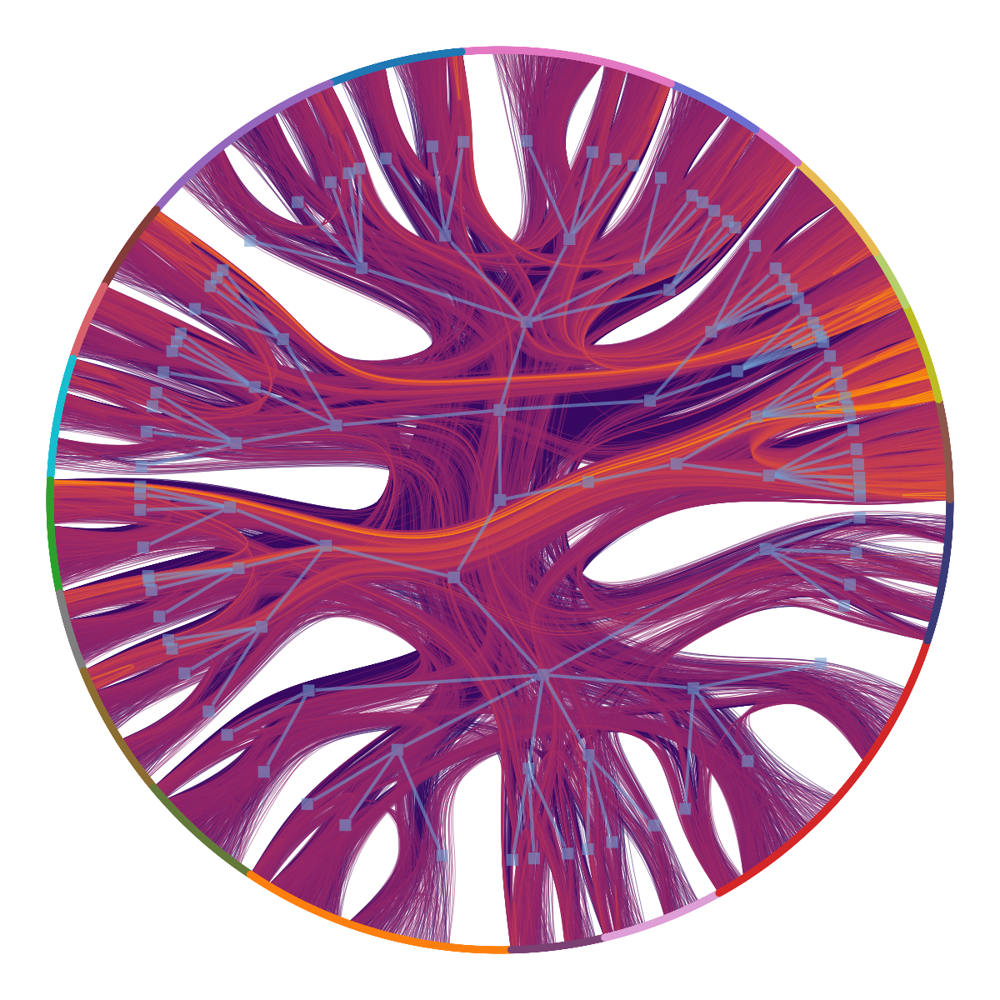

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fad8f5d7ad0, at 0x7fad8e0f0590>,
 <GraphView object, directed, with 5374 vertices and 5373 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fad753b0050, at 0x7fad753b0e90>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fad753b0050, at 0x7fad753b0f10>, False), at 0x7fad753b0050>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fad753b0050, at 0x7fad85ba9a10>)

In [ ]:
tv_head_1e2.vp.level_1 = tv_head_1e2.new_vertex_property("double", state_head_1e2.get_bs()[1][state_head_1e2.get_bs()[0]])

state_head_1e2.draw(
            eorder=tv_head_1e2.ep.z_s,
            #edge_pen_width = gf_head.ep.z_s,
            edge_color=prop_to_size(tv_head_1e2.ep.z_s, mi=-4, ma=4, power=1, log=False),
            ecmap=(mpl.inferno, .6), 
            edge_gradient=[], 
            vertex_size = 4,
            hvertex_size = 15,
            hedge_pen_width = 3,
            vertex_color = tv_head_1e2.vp.level_1,
            vertex_fill_color = tv_head_1e2.vp.level_1,
            subsample_edges = 30000)

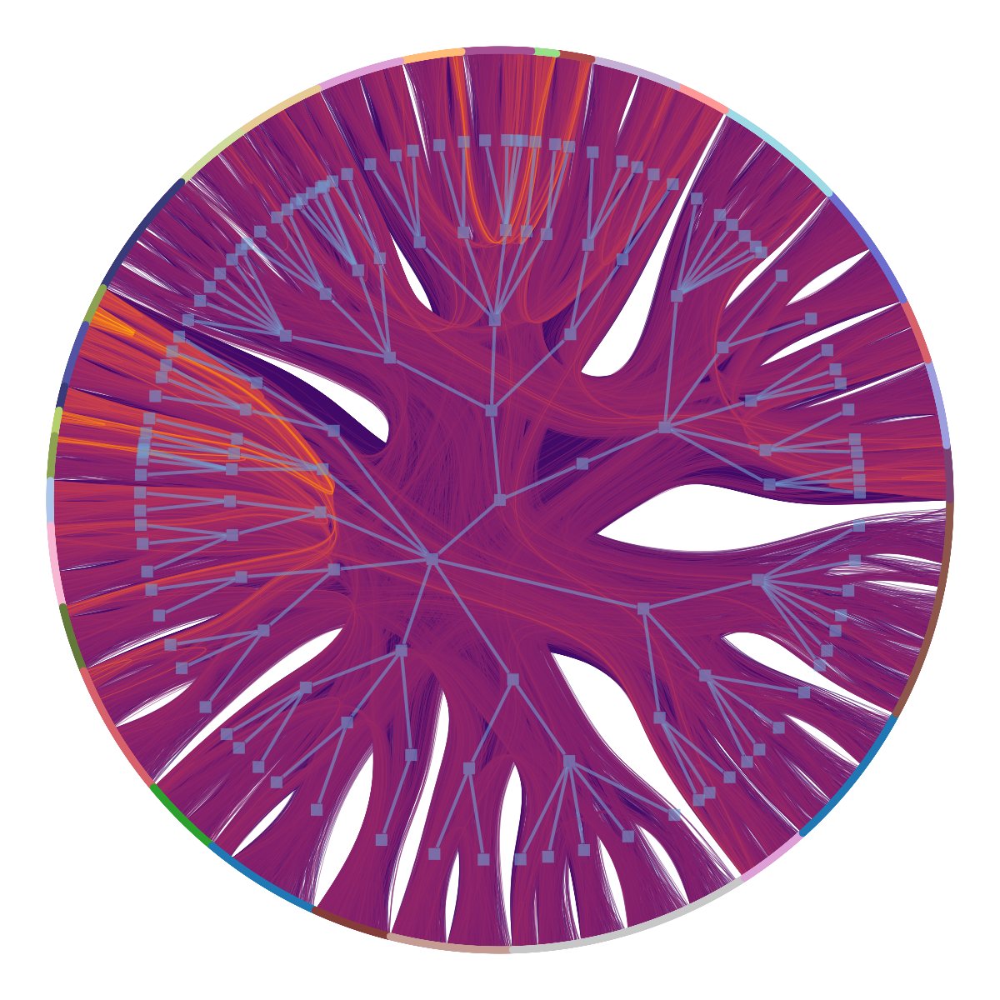

(<VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fad8e0f8350, at 0x7fad7527fc90>,
 <GraphView object, directed, with 5409 vertices and 5408 edges, edges filtered by (<EdgePropertyMap object with value type 'bool', for Graph 0x7fad753c1dd0, at 0x7fad753bda50>, False), vertices filtered by (<VertexPropertyMap object with value type 'bool', for Graph 0x7fad753c1dd0, at 0x7fad753c0b50>, False), at 0x7fad753c1dd0>,
 <VertexPropertyMap object with value type 'vector<double>', for Graph 0x7fad753c1dd0, at 0x7fad753c01d0>)

In [ ]:
g_1e1.vp.level_1 = g_1e1.new_vertex_property("double", state_head_1e1.get_bs()[1][state_head_1e1.get_bs()[0]])

state_head_1e1.draw(
            eorder=g_1e1.ep.z_s,
            #edge_pen_width = gf_head.ep.z_s,
            edge_color=prop_to_size(g_1e1.ep.z_s, mi=-4, ma=4, power=1, log=False),
            ecmap=(mpl.inferno, .6), 
            edge_gradient=[], 
            vertex_size = 4,
            hvertex_size = 10,
            hedge_pen_width = 2,
            vertex_color = g_1e1.vp.level_1,
            vertex_fill_color = g_1e1.vp.level_1,
            subsample_edges = 30000)

In [ ]:
partition_overlap(state_head_1e1.get_bs()[0], state_head_1e2.get_bs()[0], norm=True)

0.59456377114617

In [ ]:
B = len(state_head_1e1.get_bs()[0])
N = len(g_1e1.get_vertices())
x = np.random.randint(0, 10, N)
y = np.random.randint(0, 10, N)
partition_overlap(x, y)

0.11955901919787112

In [ ]:
def filterByCorr(g, cutOff):
    # Filtering edges
    corr = g.edge_properties["spearman"]
    sign = g.new_ep("bool", True)
    sign.a = np.array(corr.a > cutOff)

    tv = GraphView(g, efilt=sign)
    return tv


In [ ]:

g_ref_trim_1e2 = filterByCorr(g_ref, 0.3)
pos = arf_layout(g_ref_trim_1e2)
graph_draw(g_ref_trim_1e2, pos = pos, edge_pen_width = g_ref_trim_1e2.ep.weight ,             vertex_fill_color=g_1e1.vp.level_1)

In [ ]:

g_ref_trim_1e1 = filterByCorr(g_1e1, 0.3)
graph_draw(g_ref_trim_1e1, pos = pos, edge_pen_width = g_ref_trim_1e1.ep.weight , vertex_fill_color=g_1e1.vp.level_1)